
# **SecureLend Loan Fraud Prediction Using Data Science**



## **Environment Setup & Library Imports**

In [ ]:
# Install required libraries
!pip install ydata-profiling catboost shap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import ydata_profiling as pf
import shap
import warnings
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import ExtraTreesClassifier
from xgboost import XGBClassifier
from imblearn.over_sampling import SMOTE
from sklearn.metrics import (accuracy_score, confusion_matrix, classification_report,
                             precision_recall_curve, roc_curve, auc, average_precision_score,
                             precision_score, recall_score, f1_score)
# Configure visualization and warnings
%matplotlib inline
warnings.filterwarnings('ignore')
sns.set(style="whitegrid")
shap.initjs()

## **Data Loading & Automated EDA**

In [ ]:
# Load dataset
df = pd.read_csv('loan_data.csv')

In [ ]:
# Display initial info
print("Dataset Head:")
display(df.head())

Dataset Head:


,credit.policy,purpose,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid
0,1,debt_consolidation,0.1189,829.10,11.350407,19.48,737,5639.958333,28854,52.1,0,0,0,0
1,1,credit_card,0.1071,228.22,11.082143,14.29,707,2760.000000,33623,76.7,0,0,0,0
2,1,debt_consolidation,0.1357,366.86,10.373491,11.63,682,4710.000000,3511,25.6,1,0,0,0
3,1,debt_consolidation,0.1008,162.34,11.350407,8.10,712,2699.958333,33667,73.2,1,0,0,0
4,1,credit_card,0.1426,102.92,11.299732,14.97,667,4066.000000,4740,39.5,0,1,0,0


In [ ]:
# Generate EDA Profiling Report
EDA_Report = pf.ProfileReport(df)
EDA_Report.to_file("SecureLend_EDA_Report.html")
print("EDA Report generated as 'SecureLend_EDA_Report.html'")
EDA_Report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 14/14 [00:00<00:00, 54.94it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

EDA Report generated as 'SecureLend_EDA_Report.html'


## **Data Preprocessing & Feature Engineering**

In [ ]:
# One-Hot Encoding for the 'purpose' column
df_final = pd.get_dummies(df, columns=['purpose'], drop_first=True)
print(f"Original shape: {df.shape}")
print(f"Shape after encoding: {df_final.shape}")
# Define features (X) and target (y)
X = df_final.drop('not.fully.paid', axis=1)
y = df_final['not.fully.paid']

Original shape: (9578, 14)
Shape after encoding: (9578, 19)


## **Feature Selection & SMOTE Resampling**

In [ ]:
# 1. Feature Selection using Extra Trees
model_fs = ExtraTreesClassifier(random_state=42)
model_fs.fit(X, y)
# Get top 10 features
feat_importances = pd.Series(model_fs.feature_importances_, index=X.columns)
feat_to_keep = feat_importances.nlargest(10).index.tolist()
print(f"Top 10 Features selected: {feat_to_keep}")

Top 10 Features selected: ['int.rate', 'installment', 'log.annual.inc', 'revol.util', 'revol.bal', 'days.with.cr.line', 'dti', 'fico', 'inq.last.6mths', 'delinq.2yrs']


In [ ]:
# 2. Handling Class Imbalance with SMOTE
sm = SMOTE(random_state=42)
x_res, y_res = sm.fit_resample(X[feat_to_keep], y)
print(f"Resampled dataset shape: {x_res.shape}")

Resampled dataset shape: (16090, 10)


Before Oversampling


,count
not.fully.paid,
0,8045
1,1533


----------------------------------------------------------------------------------------------------
After Oversampling


,count
not.fully.paid,
0,8045
1,6436


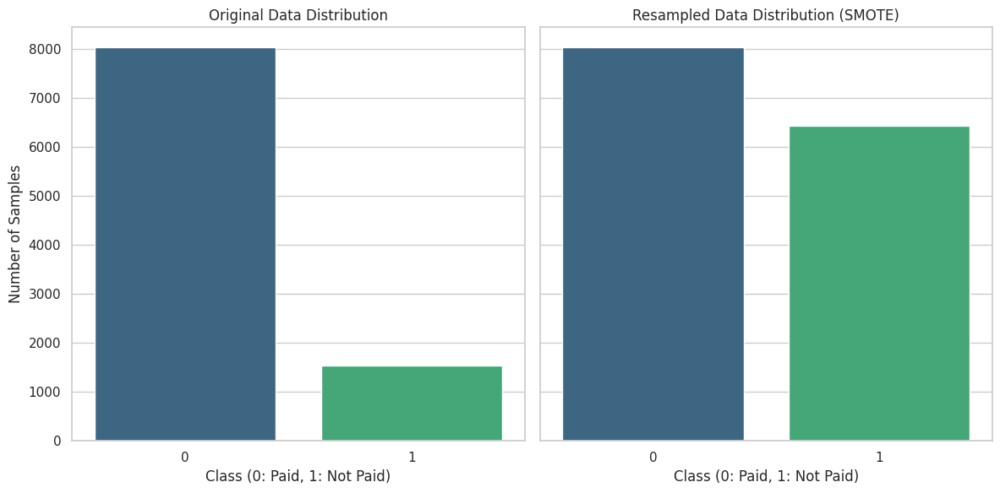

In [ ]:
print('Before Oversampling')
display(df['not.fully.paid'].value_counts())
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=42, sampling_strategy=0.8)
x_res, y_res = sm.fit_resample(X, y) # Corrected 'x' to 'X'
print('-'*100)
print('After Oversampling')
display(y_res.value_counts())

# Create distribution_df for plotting
original_distribution = df['not.fully.paid'].value_counts().rename('Original')
resampled_distribution = y_res.value_counts().rename('Resampled')
distribution_df = pd.concat([original_distribution, resampled_distribution], axis=1)

# Plotting
fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharey=True)
sns.barplot(x=distribution_df.index, y='Original', data=distribution_df, ax=axes[0], palette='viridis')
axes[0].set_title('Original Data Distribution')
axes[0].set_xlabel('Class (0: Paid, 1: Not Paid)')
axes[0].set_ylabel('Number of Samples')
axes[0].ticklabel_format(style='plain', axis='y') # Prevent scientific notation
sns.barplot(x=distribution_df.index, y='Resampled', data=distribution_df, ax=axes[1], palette='viridis')
axes[1].set_title('Resampled Data Distribution (SMOTE)')
axes[1].set_xlabel('Class (0: Paid, 1: Not Paid)')
axes[1].set_ylabel('Number of Samples')
axes[1].ticklabel_format(style='plain', axis='y') # Prevent scientific notation
plt.tight_layout()
plt.show()

## **Model Training (Logistic Regression)**

In [ ]:
# Dictionary to store trained models and metrics
models = {}
comparison_metrics = {}
def Fitmodel(X, y, algo_name, algorithm, grid_params, cv, test_size=0.3, random_state=95, threshold=0.4):
    # Split the data
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=test_size, random_state=random_state
    )
    # GridSearchCV for hyperparameter tuning
    grid = GridSearchCV(
        algorithm,
        grid_params,
        scoring='accuracy',
        n_jobs=-1,
        cv=cv
    )
    model = grid.fit(X_train, y_train)
    best_model = grid.best_estimator_
    models[algo_name] = best_model
    # Make predictions with the specified threshold
    y_prob = best_model.predict_proba(X_test)[:, 1]
    y_pred = (y_prob >= threshold).astype(int)
    # Calculate metrics for comparison
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, pos_label=1)
    recall = recall_score(y_test, y_pred, pos_label=1)
    f1 = f1_score(y_test, y_pred, pos_label=1)
    comparison_metrics[algo_name] = {
        'Accuracy': accuracy,
        'Precision (Class 1)': precision,
        'Recall (Class 1)': recall,
        'F1-Score (Class 1)': f1
    }
    print(f"Algorithm: {algo_name}")
    print(f"Threshold used: {threshold}")
    print(f"Best Parameters: {model.best_params_}")
    print(f"Accuracy: {accuracy:.4f}")
    print("Classification Report:\n", classification_report(y_test, y_pred))
    print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
    return best_model, X_test, y_test, y_pred

In [ ]:
from sklearn.linear_model import LogisticRegression
# Train Logistic Regression
params_lr = {
    'C': [0.01, 0.1, 1, 10, 100]
}
lr_model, X_test_lr, y_test_lr, y_pred_lr = Fitmodel(x_res, y_res, 'Logistic Regression', LogisticRegression(solver='liblinear', random_state=42), params_lr, cv=5, test_size=0.3, random_state=95, threshold=0.4)

Algorithm: Logistic Regression
Threshold used: 0.4
Best Parameters: {'C': 100}
Accuracy: 0.7142
Classification Report:
               precision    recall  f1-score   support

           0       0.73      0.76      0.75      2409
           1       0.69      0.66      0.67      1936

    accuracy                           0.71      4345
   macro avg       0.71      0.71      0.71      4345
weighted avg       0.71      0.71      0.71      4345

Confusion Matrix:
 [[1827  582]
 [ 660 1276]]


## **Model Training (Decision Tree)**

In [ ]:
from sklearn.tree import DecisionTreeClassifier
# Train Decision Tree
params_dt = {
    'max_depth': [3, 5, 7, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}
dt_model, X_test_dt, y_test_dt, y_pred_dt = Fitmodel(x_res, y_res, 'Decision Tree', DecisionTreeClassifier(random_state=42), params_dt, cv=5, test_size=0.3, random_state=95, threshold=0.4)

Algorithm: Decision Tree
Threshold used: 0.4
Best Parameters: {'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 5}
Accuracy: 0.7346
Classification Report:
               precision    recall  f1-score   support

           0       0.78      0.72      0.75      2409
           1       0.68      0.75      0.72      1936

    accuracy                           0.73      4345
   macro avg       0.73      0.74      0.73      4345
weighted avg       0.74      0.73      0.74      4345

Confusion Matrix:
 [[1731  678]
 [ 475 1461]]


## **Model Training (Random Forest)**

In [ ]:
from sklearn.ensemble import RandomForestClassifier
# Train Random Forest
params_rf = {
    'n_estimators': [100, 200, 300],
    'max_depth': [5, 10, None],
    'min_samples_split': [2, 5, 10]
}
rf_model, X_test_final, y_test_final, y_pred = Fitmodel(x_res, y_res, 'Random Forest', RandomForestClassifier(random_state=42), params_rf, cv=5, test_size=0.3, random_state=95, threshold=0.4)

Algorithm: Random Forest
Threshold used: 0.4
Best Parameters: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 300}
Accuracy: 0.8232
Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.80      0.83      2409
           1       0.77      0.86      0.81      1936

    accuracy                           0.82      4345
   macro avg       0.82      0.83      0.82      4345
weighted avg       0.83      0.82      0.82      4345

Confusion Matrix:
 [[1920  489]
 [ 279 1657]]


## **Model Training (XGBoost)**

In [ ]:
# Train XGBoost as the 'Best Model'
params_xgb = {
    'n_estimators': [100, 200, 300, 500, 700],
    'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.3],
    'max_depth': [3, 5, 7, 9, 11]
}
xgb_model, X_test_final, y_test_final, y_pred = Fitmodel(x_res, y_res, 'XGBoost', XGBClassifier(random_state=42), params_xgb, cv=5, test_size=0.3, random_state=95, threshold=0.4)

Algorithm: XGBoost
Threshold used: 0.4
Best Parameters: {'learning_rate': 0.05, 'max_depth': 9, 'n_estimators': 700}
Accuracy: 0.8665
Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.90      0.88      2409
           1       0.87      0.83      0.85      1936

    accuracy                           0.87      4345
   macro avg       0.87      0.86      0.86      4345
weighted avg       0.87      0.87      0.87      4345

Confusion Matrix:
 [[2161  248]
 [ 332 1604]]


In [ ]:
best_model_name = max(comparison_metrics, key=lambda model: comparison_metrics[model]['Accuracy'])
best_accuracy = comparison_metrics[best_model_name]['Accuracy']
print(f"The best model is '{best_model_name}' with an accuracy of {best_accuracy:.2f}")

The best model is 'XGBoost' with an accuracy of 0.87


In [ ]:
# One-Hot Encoding for the 'purpose' column
df_final = pd.get_dummies(df, columns=['purpose'], drop_first=True)
print(f"Original shape: {df.shape}")
print(f"Shape after encoding: {df_final.shape}")
# Define features (X) and target (y)
X = df_final.drop('not.fully.paid', axis=1)
y = df_final['not.fully.paid']

Original shape: (9578, 14)
Shape after encoding: (9578, 19)


## **Model Comparison**

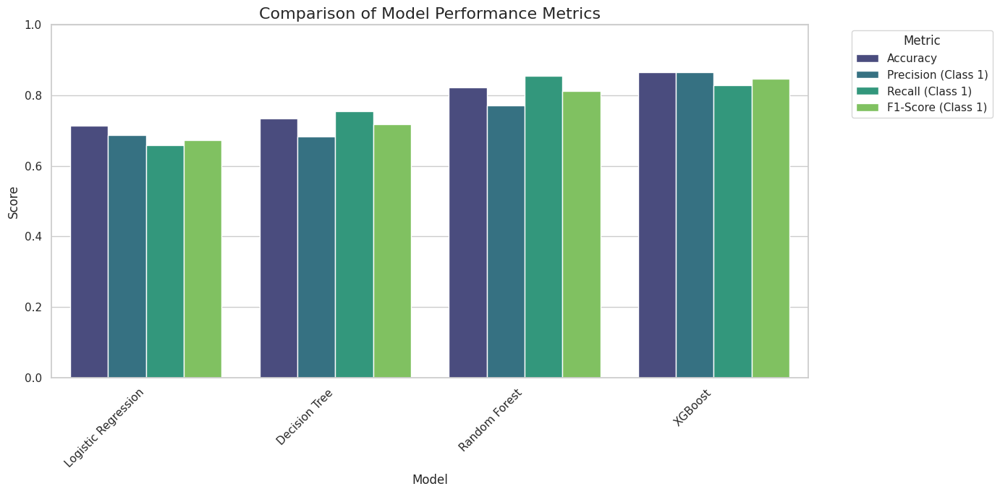

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
# Convert comparison_metrics dictionary to DataFrame for easier plotting
metrics_df = pd.DataFrame(comparison_metrics).T
metrics_df.index.name = 'Model'
metrics_df.reset_index(inplace=True)
# Prepare data for plotting (melt DataFrame to long format)
metrics_melted = metrics_df.melt(id_vars='Model', var_name='Metric', value_name='Score')
plt.figure(figsize=(14, 7))
sns.barplot(x='Model', y='Score', hue='Metric', data=metrics_melted, palette='viridis')
plt.title('Comparison of Model Performance Metrics', fontsize=16)
plt.xlabel('Model', fontsize=12)
plt.ylabel('Score', fontsize=12)
plt.ylim(0, 1) # Metrics are between 0 and 1
plt.legend(title='Metric', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

## **Analyze Misclassified Samples**

In [ ]:
# 1. Generate Predictions with a custom threshold
best_model = models['XGBoost']
y_probs = best_model.predict_proba(X_test_final)[:, 1]
y_pred = (y_probs >= 0.4).astype(int)

# 2. Print Performance Metrics
print("--- Classification Report (Threshold = 0.4) ---")
print(classification_report(y_test_final, y_pred))

--- Classification Report (Threshold = 0.4) ---
              precision    recall  f1-score   support

           0       0.87      0.90      0.88      2409
           1       0.87      0.83      0.85      1936

    accuracy                           0.87      4345
   macro avg       0.87      0.86      0.86      4345
weighted avg       0.87      0.87      0.87      4345




Total False Positives: 248 | Total False Negatives: 332


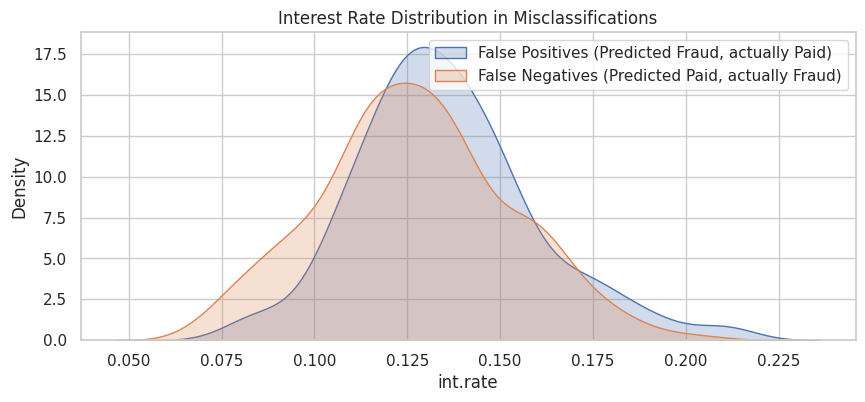

In [ ]:
# 4. Error Analysis Visualization
comparison_df = X_test_final.copy()
comparison_df['Actual_Status'] = y_test_final.values
comparison_df['Predicted_Status'] = y_pred
false_positives = comparison_df[(comparison_df['Actual_Status'] == 0) & (comparison_df['Predicted_Status'] == 1)]
false_negatives = comparison_df[(comparison_df['Actual_Status'] == 1) & (comparison_df['Predicted_Status'] == 0)]
print(f"\nTotal False Positives: {len(false_positives)} | Total False Negatives: {len(false_negatives)}")
plt.figure(figsize=(10, 4))
sns.kdeplot(false_positives['int.rate'], label='False Positives (Predicted Fraud, actually Paid)', fill=True)
sns.kdeplot(false_negatives['int.rate'], label='False Negatives (Predicted Paid, actually Fraud)', fill=True)
plt.title('Interest Rate Distribution in Misclassifications')
plt.legend()
plt.show()

## **Global & Local Explanations (SHAP)**

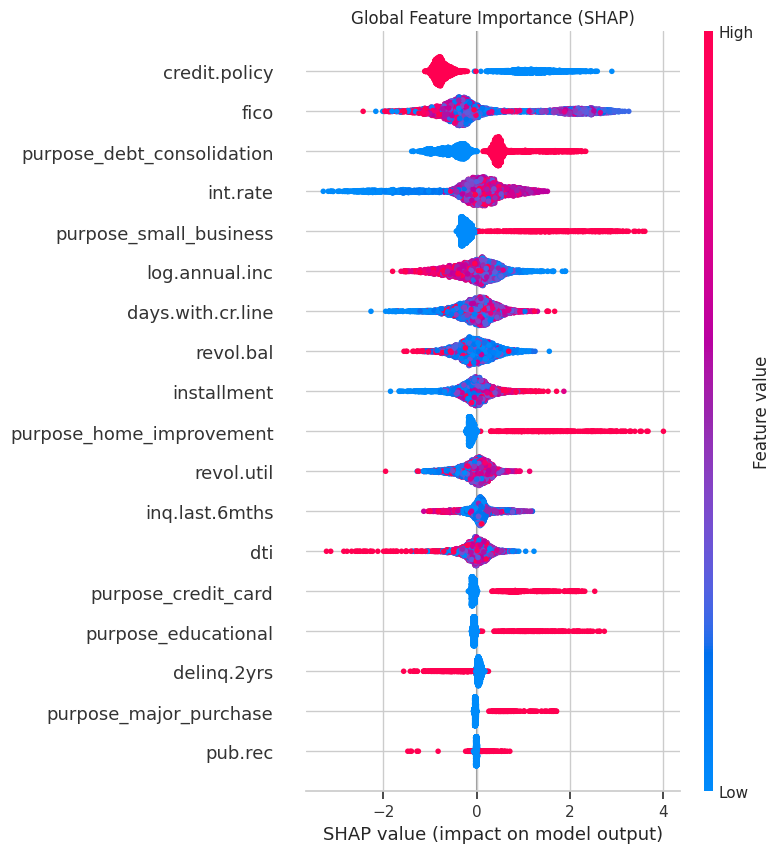

Local Explanation for missed fraud (Index 244) with threshold 0.4:


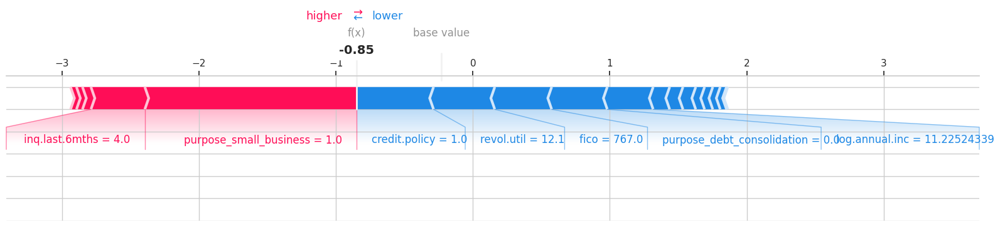

In [ ]:
# Initialize SHAP Explainer
best_model = models['XGBoost'] # Retrieve the best model from the dictionary
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(X_test_final)
# Re-create comparison_df and derived false_negatives to ensure they are aligned with current X_test_final and y_pred
comparison_df = X_test_final.copy()
comparison_df['Actual_Status'] = y_test_final.values
comparison_df['Predicted_Status'] = y_pred
# 1. Global Importance (Summary Plot)
plt.title("Global Feature Importance (SHAP)")
shap.summary_plot(shap_values, X_test_final)
# 2. Local Explanation (Force Plot for a single False Negative)
# Recalculate false_negatives based on the new threshold
false_negatives = comparison_df[(comparison_df['Actual_Status'] == 1) & (comparison_df['Predicted_Status'] == 0)]
if len(false_negatives) > 0:
    fn_idx = false_negatives.index[0]
    # Get the location of this index in X_test_final
    loc_idx = X_test_final.index.get_loc(fn_idx)
    print(f"Local Explanation for missed fraud (Index {fn_idx}) with threshold 0.4:")
    shap.force_plot(explainer.expected_value, shap_values[loc_idx], X_test_final.iloc[loc_idx], matplotlib=True)
else:
    print("No False Negatives found with the current threshold.")

## **Analyze Feature Interactions**

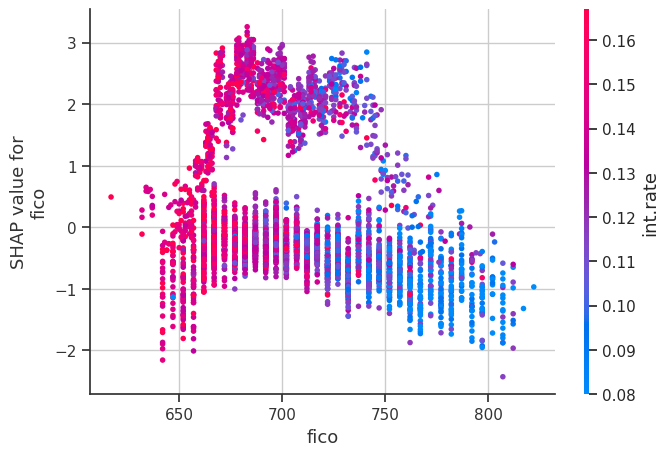

In [ ]:
# SHAP Dependence Plot
# This shows how FICO score impact changes as Interest Rate varies
shap.dependence_plot("fico", shap_values, X_test_final, interaction_index="int.rate")

## **Threshold Optimization & Advanced Metrics**

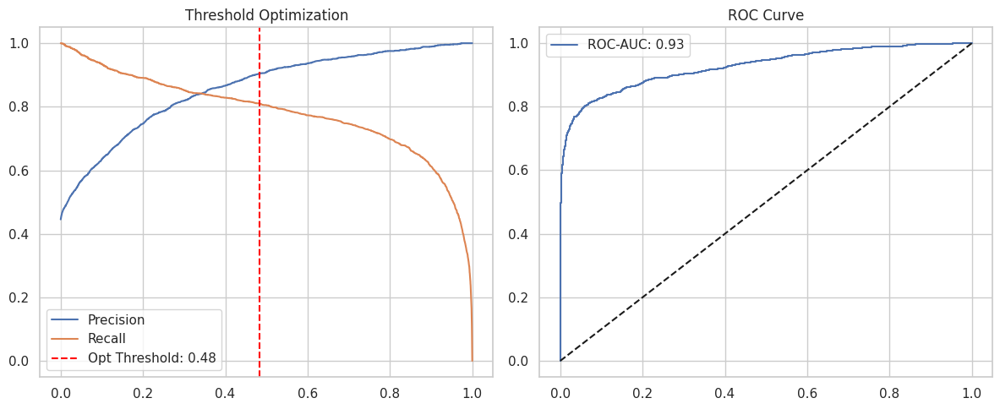

Recommended Threshold for Maximum F1: 0.48


In [ ]:
# 1. Precision-Recall & Threshold Tuning
precision, recall, thresholds = precision_recall_curve(y_test_final, y_probs)
f1_scores = 2 * (precision * recall) / (precision + recall + 1e-10)
opt_threshold = thresholds[np.argmax(f1_scores)]
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(thresholds, precision[:-1], label="Precision")
plt.plot(thresholds, recall[:-1], label="Recall")
plt.axvline(opt_threshold, color='red', linestyle='--', label=f'Opt Threshold: {opt_threshold:.2f}')
plt.title("Threshold Optimization")
plt.legend()
# 2. ROC and PR Curves
fpr, tpr, _ = roc_curve(y_test_final, y_probs)
plt.subplot(1, 2, 2)
plt.plot(fpr, tpr, label=f"ROC-AUC: {auc(fpr, tpr):.2f}")
plt.plot([0,1], [0,1], 'k--')
plt.title("ROC Curve")
plt.legend()
plt.tight_layout()
plt.show()
print(f"Recommended Threshold for Maximum F1: {opt_threshold:.2f}")

## **Prediction Table**

In [ ]:
# Create the Prediction Comparison Table (X vs Y_actual vs Y_predicted)
comparison_df = X_test_final.copy()
comparison_df['Actual_Status'] = y_test_final.values
comparison_df['Predicted_Status'] = y_pred

# Map 0 and 1 to readable labels
label_map = {0: 'Paid', 1: 'Not Paid (Fraud)'}
comparison_df['Actual_Label'] = comparison_df['Actual_Status'].map(label_map)
comparison_df['Predicted_Label'] = comparison_df['Predicted_Status'].map(label_map)
print("\n--- Prediction Table (Sample of X vs Actual Y vs Predicted Y) ---")
display(comparison_df[['Actual_Label', 'Predicted_Label'] + feat_to_keep].head(10))


--- Prediction Table (Sample of X vs Actual Y vs Predicted Y) ---


,Actual_Label,Predicted_Label,int.rate,installment,log.annual.inc,revol.util,revol.bal,days.with.cr.line,dti,fico,inq.last.6mths,delinq.2yrs
1496,Paid,Paid,0.108300,293.930000,10.558414,0.000000,0,2670.041667,17.860000,737,1,0
9638,Not Paid (Fraud),Not Paid (Fraud),0.133872,338.811797,11.033613,38.411388,6664,2876.938019,12.571242,674,4,0
3586,Paid,Paid,0.122100,506.390000,11.695247,76.800000,10750,4453.958333,8.910000,742,5,0
1929,Paid,Paid,0.134700,339.230000,11.775290,90.900000,26822,4200.041667,13.850000,702,2,1
6079,Paid,Paid,0.085900,237.080000,11.082143,11.000000,5720,4440.041667,19.880000,767,0,0
1940,Paid,Paid,0.118900,169.140000,10.239960,52.100000,20722,4080.000000,16.110000,697,2,0
2726,Paid,Paid,0.147400,276.300000,10.308953,88.000000,21202,8617.000000,15.440000,677,0,1
8174,Paid,Paid,0.152000,470.180000,10.778956,70.400000,32005,5339.041667,26.080000,687,1,0
1847,Paid,Paid,0.093200,95.850000,10.120854,12.900000,4851,1860.000000,18.010000,722,2,0
5473,Paid,Paid,0.089400,57.190000,11.211820,76.500000,34751,4980.958333,13.280000,717,1,0
